In [1]:
# Mask2Former-Panoptic
# ------------------
!pip install -q transformers datasets torchvision pycocotools

In [2]:
from huggingface_hub import login
from google.colab import userdata
token = userdata.get('Nyi_token')
login(token=token)

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Hugging Face

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


In [4]:
from transformers import AutoImageProcessor, Mask2FormerForUniversalSegmentation
from PIL import Image
import requests
import io
import os
import torch
import numpy
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt

`label_ids_to_fuse` unset. No instance will be fused.


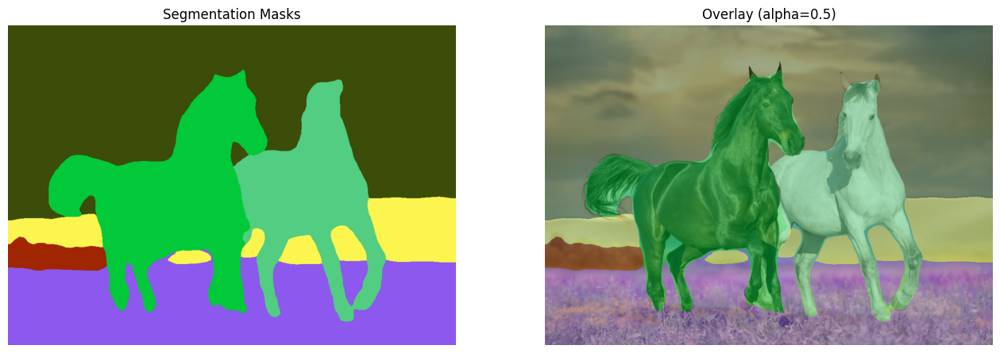

In [ ]:
image_path = "datasets/vitpose_models/horses.jpg"
image = Image.open(image_path).convert("RGB")

device = "cuda" if torch.cuda.is_available() else "cpu"

# load Mask2Former fine-tuned on COCO panoptic segmentation
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-base-coco-panoptic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-base-coco-panoptic", device_map=device)

inputs = processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

# model predicts class_queries_logits of shape `(batch_size, num_queries)`
# and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
class_queries_logits = outputs.class_queries_logits
masks_queries_logits = outputs.masks_queries_logits

result = processor.post_process_panoptic_segmentation(outputs, target_sizes=[image.size[::-1]], threshold=0.5)[0]
panoptic_seg_id = result["segmentation"].cpu().numpy()

# Get unique IDs from segmentation
unique_ids = numpy.unique(panoptic_seg_id)

# Assign random colors to each unique ID
id_to_color = {id_val: [random.randint(0, 255) for _ in range(3)] for id_val in unique_ids}

# Build a color mask image
color_mask = numpy.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=numpy.uint8)
for id_val, color in id_to_color.items():
    color_mask[panoptic_seg_id == id_val] = color

# Ensure mask matches original image size
original_np = np.array(image)
color_mask = cv2.resize(color_mask, (original_np.shape[1], original_np.shape[0]), interpolation=cv2.INTER_NEAREST)

# Alpha blending overlay
alpha = 0.5  # transparency control
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# Plot side-by-side
plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)

plt.show()

In [5]:
#--- COCO categories list 132 ---
COCO_CATEGORIES = [
    {"color": [220, 20, 60], "isthing": 1, "id": 0, "name": "person"},
    {"color": [119, 11, 32], "isthing": 1, "id": 1, "name": "bicycle"},
    {"color": [0, 0, 142], "isthing": 1, "id": 2, "name": "car"},
    {"color": [0, 0, 230], "isthing": 1, "id": 3, "name": "motorcycle"},
    {"color": [106, 0, 228], "isthing": 1, "id": 4, "name": "airplane"},
    {"color": [0, 60, 100], "isthing": 1, "id": 5, "name": "bus"},
    {"color": [0, 80, 100], "isthing": 1, "id": 6, "name": "train"},
    {"color": [0, 0, 70], "isthing": 1, "id": 7, "name": "truck"},
    {"color": [0, 0, 192], "isthing": 1, "id": 8, "name": "boat"},
    {"color": [250, 170, 30], "isthing": 1, "id": 9, "name": "traffic light"},
    {"color": [100, 170, 30], "isthing": 1, "id": 10, "name": "fire hydrant"},
    {"color": [220, 220, 0], "isthing": 1, "id": 11, "name": "stop sign"},
    {"color": [175, 116, 175], "isthing": 1, "id": 12, "name": "parking meter"},
    {"color": [250, 0, 30], "isthing": 1, "id": 13, "name": "bench"},
    {"color": [165, 42, 42], "isthing": 1, "id": 14, "name": "bird"},
    {"color": [255, 77, 255], "isthing": 1, "id": 15, "name": "cat"},
    {"color": [0, 226, 252], "isthing": 1, "id": 16, "name": "dog"},
    {"color": [182, 182, 255], "isthing": 1, "id": 17, "name": "horse"},
    {"color": [0, 82, 0], "isthing": 1, "id": 18, "name": "sheep"},
    {"color": [120, 166, 157], "isthing": 1, "id": 19, "name": "cow"},
    {"color": [110, 76, 0], "isthing": 1, "id": 20, "name": "elephant"},
    {"color": [174, 57, 255], "isthing": 1, "id": 21, "name": "bear"},
    {"color": [199, 100, 0], "isthing": 1, "id": 22, "name": "zebra"},
    {"color": [72, 0, 118], "isthing": 1, "id": 23, "name": "giraffe"},
    {"color": [255, 179, 240], "isthing": 1, "id": 24, "name": "backpack"},
    {"color": [0, 125, 92], "isthing": 1, "id": 25, "name": "umbrella"},
    {"color": [209, 0, 151], "isthing": 1, "id": 26, "name": "handbag"},
    {"color": [188, 208, 182], "isthing": 1, "id": 27, "name": "tie"},
    {"color": [0, 220, 176], "isthing": 1, "id": 28, "name": "suitcase"},
    {"color": [255, 99, 164], "isthing": 1, "id": 29, "name": "frisbee"},
    {"color": [92, 0, 73], "isthing": 1, "id": 30, "name": "skis"},
    {"color": [133, 129, 255], "isthing": 1, "id": 31, "name": "snowboard"},
    {"color": [78, 180, 255], "isthing": 1, "id": 32, "name": "sports ball"},
    {"color": [0, 228, 0], "isthing": 1, "id": 33, "name": "kite"},
    {"color": [174, 255, 243], "isthing": 1, "id": 34, "name": "baseball bat"},
    {"color": [45, 89, 255], "isthing": 1, "id": 35, "name": "baseball glove"},
    {"color": [134, 134, 103], "isthing": 1, "id": 36, "name": "skateboard"},
    {"color": [145, 148, 174], "isthing": 1, "id": 37, "name": "surfboard"},
    {"color": [255, 208, 186], "isthing": 1, "id": 38, "name": "tennis racket"},
    {"color": [197, 226, 255], "isthing": 1, "id": 39, "name": "bottle"},
    {"color": [171, 134, 1], "isthing": 1, "id": 40, "name": "wine glass"},
    {"color": [109, 63, 54], "isthing": 1, "id": 41, "name": "cup"},
    {"color": [207, 138, 255], "isthing": 1, "id": 42, "name": "fork"},
    {"color": [151, 0, 95], "isthing": 1, "id": 43, "name": "knife"},
    {"color": [9, 80, 61], "isthing": 1, "id": 44, "name": "spoon"},
    {"color": [84, 105, 51], "isthing": 1, "id": 45, "name": "bowl"},
    {"color": [74, 65, 105], "isthing": 1, "id": 46, "name": "banana"},
    {"color": [166, 196, 102], "isthing": 1, "id": 47, "name": "apple"},
    {"color": [208, 195, 210], "isthing": 1, "id": 48, "name": "sandwich"},
    {"color": [255, 109, 65], "isthing": 1, "id": 49, "name": "orange"},
    {"color": [0, 143, 149], "isthing": 1, "id": 50, "name": "broccoli"},
    {"color": [179, 0, 194], "isthing": 1, "id": 51, "name": "carrot"},
    {"color": [209, 99, 106], "isthing": 1, "id": 52, "name": "hot dog"},
    {"color": [5, 121, 0], "isthing": 1, "id": 53, "name": "pizza"},
    {"color": [227, 255, 205], "isthing": 1, "id": 54, "name": "donut"},
    {"color": [147, 186, 208], "isthing": 1, "id": 55, "name": "cake"},
    {"color": [153, 69, 1], "isthing": 1, "id": 56, "name": "chair"},
    {"color": [3, 95, 161], "isthing": 1, "id": 57, "name": "couch"},
    {"color": [163, 255, 0], "isthing": 1, "id": 58, "name": "potted plant"},
    {"color": [119, 0, 170], "isthing": 1, "id": 59, "name": "bed"},
    {"color": [0, 182, 199], "isthing": 1, "id": 60, "name": "dining table"},
    {"color": [0, 165, 120], "isthing": 1, "id": 61, "name": "toilet"},
    {"color": [183, 130, 88], "isthing": 1, "id": 62, "name": "tv"},
    {"color": [95, 32, 0], "isthing": 1, "id": 63, "name": "laptop"},
    {"color": [130, 114, 135], "isthing": 1, "id": 64, "name": "mouse"},
    {"color": [110, 129, 133], "isthing": 1, "id": 65, "name": "remote"},
    {"color": [166, 74, 118], "isthing": 1, "id": 66, "name": "keyboard"},
    {"color": [219, 142, 185], "isthing": 1, "id": 67, "name": "cell phone"},
    {"color": [79, 210, 114], "isthing": 1, "id": 68, "name": "microwave"},
    {"color": [178, 90, 62], "isthing": 1, "id": 69, "name": "oven"},
    {"color": [65, 70, 15], "isthing": 1, "id": 70, "name": "toaster"},
    {"color": [127, 167, 115], "isthing": 1, "id": 71, "name": "sink"},
    {"color": [59, 105, 106], "isthing": 1, "id": 72, "name": "refrigerator"},
    {"color": [142, 108, 45], "isthing": 1, "id": 73, "name": "book"},
    {"color": [196, 172, 0], "isthing": 1, "id": 74, "name": "clock"},
    {"color": [95, 54, 80], "isthing": 1, "id": 75, "name": "vase"},
    {"color": [128, 76, 255], "isthing": 1, "id": 76, "name": "scissors"},
    {"color": [201, 57, 1], "isthing": 1, "id": 77, "name": "teddy bear"},
    {"color": [246, 0, 122], "isthing": 1, "id": 78, "name": "hair drier"},
    {"color": [191, 162, 208], "isthing": 1, "id": 79, "name": "toothbrush"},

    {"color": [255, 255, 128], "isthing": 0, "id": 80, "name": "banner"},
    {"color": [147, 211, 203], "isthing": 0, "id": 81, "name": "blanket"},
    {"color": [150, 100, 100], "isthing": 0, "id": 82, "name": "bridge"},
    {"color": [168, 171, 172], "isthing": 0, "id": 83, "name": "cardboard"},
    {"color": [146, 112, 198], "isthing": 0, "id": 84, "name": "counter"},
    {"color": [210, 170, 100], "isthing": 0, "id": 85, "name": "curtain"},
    {"color": [92, 136, 89], "isthing": 0, "id": 86, "name": "door"},
    {"color": [218, 88, 184], "isthing": 0, "id": 87, "name": "floor-wood"},
    {"color": [241, 129, 0], "isthing": 0, "id": 88, "name": "flower"},
    {"color": [217, 17, 255], "isthing": 0, "id": 89, "name": "fruit"},
    {"color": [124, 74, 181], "isthing": 0, "id": 90, "name": "gravel"},
    {"color": [70, 70, 70], "isthing": 0, "id": 91, "name": "house"},
    {"color": [255, 228, 255], "isthing": 0, "id": 92, "name": "light"},
    {"color": [154, 208, 0], "isthing": 0, "id": 93, "name": "mirror"},
    {"color": [193, 0, 92], "isthing": 0, "id": 94, "name": "net"},
    {"color": [76, 91, 113], "isthing": 0, "id": 95, "name": "pillow"},
    {"color": [255, 180, 195], "isthing": 0, "id": 96, "name": "platform"},
    {"color": [106, 154, 176], "isthing": 0, "id": 97, "name": "playingfield"},
    {"color": [230, 150, 140], "isthing": 0, "id": 98, "name": "railroad"},
    {"color": [60, 143, 255], "isthing": 0, "id": 99, "name": "river"},
    {"color": [128, 64, 128], "isthing": 0, "id": 100, "name": "road"},
    {"color": [92, 82, 55], "isthing": 0, "id": 101, "name": "roof"},
    {"color": [254, 212, 124], "isthing": 0, "id": 102, "name": "sand"},
    {"color": [73, 77, 174], "isthing": 0, "id": 103, "name": "sea"},
    {"color": [255, 160, 98], "isthing": 0, "id": 104, "name": "shelf"},
    {"color": [255, 255, 255], "isthing": 0, "id": 105, "name": "snow"},
    {"color": [104, 84, 109], "isthing": 0, "id": 106, "name": "stairs"},
    {"color": [169, 164, 131], "isthing": 0, "id": 107, "name": "tent"},
    {"color": [225, 199, 255], "isthing": 0, "id": 108, "name": "towel"},
    {"color": [137, 54, 74], "isthing": 0, "id": 109, "name": "wall-brick"},
    {"color": [135, 158, 223], "isthing": 0, "id": 110, "name": "wall-stone"},
    {"color": [7, 246, 231], "isthing": 0, "id": 111, "name": "wall-tile"},
    {"color": [107, 255, 200], "isthing": 0, "id": 112, "name": "wall-wood"},
    {"color": [58, 41, 149], "isthing": 0, "id": 113, "name": "water"},
    {"color": [183, 121, 142], "isthing": 0, "id": 114, "name": "window-blind"},
    {"color": [255, 73, 97], "isthing": 0, "id": 115, "name": "window"},
    {"color": [107, 142, 35], "isthing": 0, "id": 116, "name": "tree"},
    {"color": [190, 153, 153], "isthing": 0, "id": 117, "name": "fence"},
    {"color": [146, 139, 141], "isthing": 0, "id": 118, "name": "ceiling"},
    {"color": [70, 130, 180], "isthing": 0, "id": 119, "name": "sky"},
    {"color": [134, 199, 156], "isthing": 0, "id": 120, "name": "cabinet"},
    {"color": [209, 226, 140], "isthing": 0, "id": 121, "name": "table"},
    {"color": [96, 36, 108], "isthing": 0, "id": 122, "name": "floor"},
    {"color": [96, 96, 96], "isthing": 0, "id": 123, "name": "pavement"},
    {"color": [64, 170, 64], "isthing": 0, "id": 124, "name": "mountain"},
    {"color": [152, 251, 152], "isthing": 0, "id": 125, "name": "grass"},
    {"color": [208, 229, 228], "isthing": 0, "id": 126, "name": "dirt"},
    {"color": [206, 186, 171], "isthing": 0, "id": 127, "name": "paper"},
    {"color": [152, 161, 64], "isthing": 0, "id": 128, "name": "food"},
    {"color": [116, 112, 0], "isthing": 0, "id": 129, "name": "building"},
    {"color": [0, 114, 143], "isthing": 0, "id": 130, "name": "rock"},
    {"color": [102, 102, 156], "isthing": 0, "id": 131, "name": "wall"},
    {"color": [250, 141, 255], "isthing": 0, "id": 132, "name": "rug"},
]

COCO_BY_ID = {c["id"]: c for c in COCO_CATEGORIES}

`label_ids_to_fuse` unset. No instance will be fused.


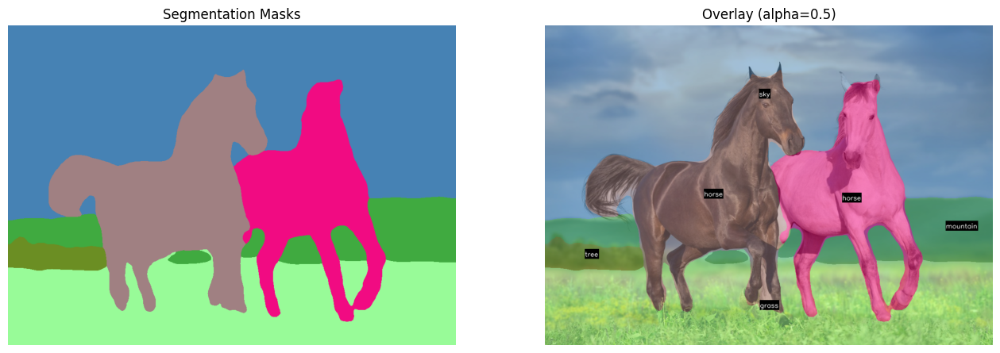

In [ ]:
image_path = "datasets/vitpose_models/horses.jpg"
image = Image.open(image_path).convert("RGB")

device = "cuda" if torch.cuda.is_available() else "cpu"

# load Mask2Former fine-tuned on COCO panoptic segmentation
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-base-coco-panoptic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-base-coco-panoptic", device_map=device)

inputs = processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

# model predicts class_queries_logits of shape `(batch_size, num_queries)`
# and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
class_queries_logits = outputs.class_queries_logits
masks_queries_logits = outputs.masks_queries_logits

result = processor.post_process_panoptic_segmentation(outputs, target_sizes=[image.size[::-1]], threshold=0.5)[0]
panoptic_seg_id = result["segmentation"].cpu().numpy()

# --- Create color mask ---
color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    # category_id = seg_info["category_id"] # This key does not exist
    label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
    cat = COCO_BY_ID.get(label_id, None)
    if cat is None:
        continue

    mask = (panoptic_seg_id == segment_id)

    # Thing: random color per instance
    if cat["isthing"]:
        color = [random.randint(0, 255) for _ in range(3)]
    else:
        # Stuff: fixed COCO color
        color = cat["color"]

    color_mask[mask] = color

# --- Resize and overlay ---
original_np = np.array(image)
H, W = original_np.shape[:2]
color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

alpha = 0.5
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# --- Draw labels ---
for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    # category_id = seg_info["category_id"] # This key does not exist
    label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
    cat = COCO_BY_ID.get(label_id, None)
    if cat is None:
        continue
    label_text = cat["name"]

    mask = (panoptic_id_resized == segment_id).astype(np.uint8)
    if mask.sum() == 0:
        continue

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
    largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    cx, cy = centroids[largest_idx]
    cx = int(np.clip(cx, 0, W - 1))
    cy = int(np.clip(cy, 0, H - 1))

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.5
    thickness = 1
    (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
    rect_tl = (cx-15, cy - text_height - baseline)
    rect_br = (cx-15 + text_width, cy + baseline)
    rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
    rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

    cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
    cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

# --- Display ---
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)
plt.show()

`label_ids_to_fuse` unset. No instance will be fused.


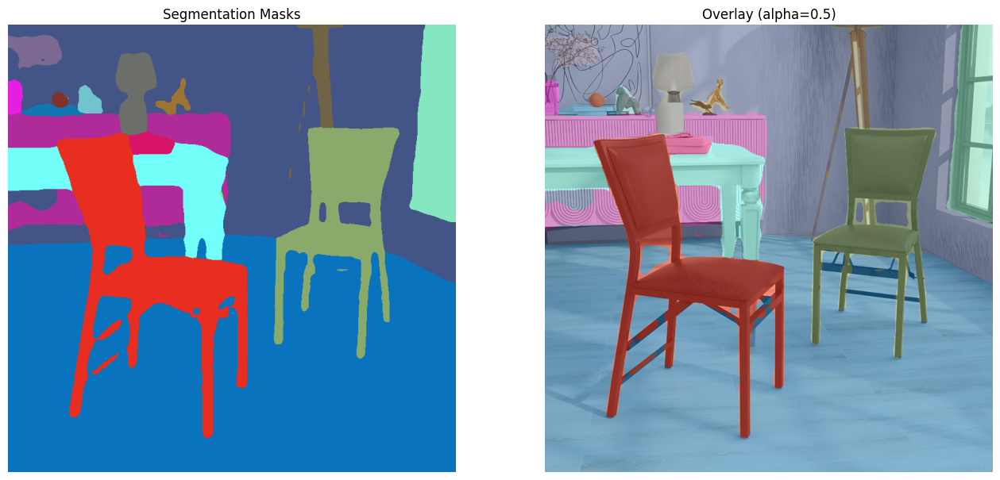

In [ ]:
image_path = "datasets/3d_test/chair.jpg"
image = Image.open(image_path).convert("RGB")

device = "cuda" if torch.cuda.is_available() else "cpu"

# load Mask2Former fine-tuned on ADE20k panoptic segmentation
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-large-ade-panoptic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-large-ade-panoptic", device_map=device)

inputs = processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

# model predicts class_queries_logits of shape `(batch_size, num_queries)`
# and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
class_queries_logits = outputs.class_queries_logits
masks_queries_logits = outputs.masks_queries_logits

result = processor.post_process_panoptic_segmentation(outputs, target_sizes=[image.size[::-1]], threshold=0.5)[0]
panoptic_seg_id = result["segmentation"].cpu().numpy()

# Get unique IDs from segmentation
unique_ids = numpy.unique(panoptic_seg_id)

# Assign random colors to each unique ID
id_to_color = {id_val: [random.randint(0, 255) for _ in range(3)] for id_val in unique_ids}

# Build a color mask image
color_mask = numpy.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=numpy.uint8)
for id_val, color in id_to_color.items():
    color_mask[panoptic_seg_id == id_val] = color

# Ensure mask matches original image size
original_np = np.array(image)
color_mask = cv2.resize(color_mask, (original_np.shape[1], original_np.shape[0]), interpolation=cv2.INTER_NEAREST)

# Alpha blending overlay
alpha = 0.5  # transparency control
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# Plot side-by-side
plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)

plt.show()

In [ ]:
import re, json, sys

# ======= list table =======
INPUT_TEXT = r"""
(color)	isstuff	id	name
(120, 120, 120)	1	1	wall
(180, 120, 120)	1	2	building
(6, 230, 230)	1	3	sky
(80, 50, 50)	1	4	floor
(4, 200, 3)	0	5	tree
(120, 120, 80)	1	6	ceiling
(140, 140, 140)	1	7	road
(204, 5, 255)	0	8	bed
(230, 230, 230)	0	9	window
(4, 250, 7)	1	10	grass
(224, 5, 255)	0	11	cabinet
(235, 255, 7)	1	12	pavement
(150, 5, 61)	0	13	person
(120, 120, 70)	1	14	ground
(8, 255, 51)	0	15	door
(255, 6, 82)	0	16	table
(143, 255, 140)	1	17	mountain
(204, 255, 4)	0	18	plant
(255, 51, 7)	0	19	curtain
(204, 70, 3)	0	20	chair
(0, 102, 200)	0	21	car
(61, 230, 250)	1	22	water
(255, 6, 51)	0	23	painting
(11, 102, 255)	0	24	sofa
(255, 7, 71)	0	25	shelf
(255, 9, 224)	1	26	house
(9, 7, 230)	1	27	sea
(220, 220, 220)	0	28	mirror
(255, 9, 92)	1	29	rug
(112, 9, 255)	1	30	field
(8, 255, 214)	0	31	armchair
(7, 255, 224)	0	32	seat
(255, 184, 6)	0	33	fence
(10, 255, 71)	0	34	desk
(255, 41, 10)	0	35	rock
(7, 255, 255)	0	36	closet
(224, 255, 8)	0	37	lamp
(102, 8, 255)	0	38	bath
(255, 61, 6)	0	39	rail
(255, 194, 7)	0	40	cushion
(255, 122, 8)	0	41	stand
(0, 255, 20)	0	42	box
(255, 8, 41)	0	43	pillar
(255, 5, 153)	0	44	signboard
(6, 51, 255)	0	45	drawers
(235, 12, 255)	0	46	counter
(160, 150, 20)	1	47	sand
(0, 163, 255)	0	48	sink
(140, 140, 140)	1	49	skyscraper
(0250, 10, 15)	0	50	fireplace
(20, 255, 0)	0	51	refrigerator
(31, 255, 0)	1	52	stand
(255, 31, 0)	1	53	path
(255, 224, 0)	0	54	stairs
(153, 255, 0)	1	55	runway
(0, 0, 255)	0	56	display
(255, 71, 0)	0	57	snookertable
(0, 235, 255)	0	58	pillow
(0, 173, 255)	0	59	screen
(31, 0, 255)	1	60	staircase
(11, 200, 200)	1	61	river
(255 ,82, 0)	1	62	bridge
(0, 255, 245)	0	63	bookcase
(0, 61, 255)	0	64	blindscreen
(0, 255, 112)	0	65	coffeetable
(0, 255, 133)	0	66	toilet
(255, 0, 0)	0	67	flower
(255, 163, 0)	0	68	book
(255, 102, 0)	1	69	hill
(194, 255, 0)	0	70	bench
(0, 143, 255)	0	71	countertop
(51, 255, 0)	0	72	stove
(0, 82, 255)	0	73	palmtree
(0, 255, 41)	0	74	kitchen
(0, 255, 173)	0	75	computer
(10, 0, 255)	0	76	chair
(173, 255, 0)	0	77	boat
(0, 255, 153)	0	78	bar
(255, 92, 0)	0	79	arcademachine
(255, 0, 255)	1	80	hovel
(255, 0, 245)	0	81	bus
(255, 0, 102)	0	82	towel
(255, 173, 0)	0	83	light
(255, 0, 20)	0	84	truck
(255, 184, 184)	1	85	tower
(0, 31, 255)	0	86	pendent
(0, 255, 61)	0	87	sunshade
(0, 71, 255)	0	88	streetlight
(255, 0, 204)	0	89	booth
(0, 255, 194)	0	90	television
(0, 255, 82)	0	91	airplane
(0, 10, 255)	1	92	dirt
(0, 112, 255)	0	93	clothes
(51, 0, 255)	0	94	pole
(0, 194, 255)	1	95	land
(0, 122, 255)	0	96	handrail
(0, 255, 163)	1	97	escalator
(255, 153, 0)	0	98	ottoman
(0, 255, 10)	0	99	bottle
(255, 112, 0)	0	100	counter
(143, 255, 0)	0	101	poster
(82, 0, 255)	1	102	stage
(163, 255, 0)	0	103	van
(255, 235, 0)	0	104	ship
(8, 184, 170)	0	105	fountain
(133, 0, 255)	1	106	conveyer
(0, 255, 92)	0	107	canopy
(184, 0, 255)	0	108	washingmachine
(255, 0, 31)	0	109	toy
(0, 184, 255)	1	110	swimmingpool
(0, 214, 255)	0	111	stool
(255, 0, 112)	0	112	barrel
(92, 255, 0)	0	113	basket
(0, 224, 255)	1	114	waterfall
(112, 224, 255)	0	115	shelter
(70, 184, 160)	0	116	bag
(163, 0, 255)	0	117	motorbike
(153, 0, 255)	0	118	cradle
(71, 255, 0)	0	119	oven
(255, 0, 163)	0	120	ball
(255, 204, 0)	0	121	food
(255, 0, 143)	0	122	stair
(0, 255, 235)	0	123	tank
(133, 255, 0)	0	124	trade
(255, 0, 235)	0	125	microwave
(245, 0, 255)	0	126	pot
(255, 0, 122)	0	127	creature
(255, 245, 0)	0	128	bicycle
(10, 190, 212)	1	129	lake
(214, 255, 0)	0	130	dishwasher
(0, 204, 255)	0	131	screen
(20, 0, 255)	0	132	blanket
(255, 255, 0)	0	133	sculpture
(0, 153, 255)	0	134	hood
(0, 41, 255)	0	135	sconce
(0, 255, 204)	0	136	vase
(41, 0, 255)	0	137	trafficlight
(41, 255, 0)	0	138	tray
(173, 0, 255)	0	139	bin
(0, 245, 255)	0	140	fan
(71, 0, 255)	1	141	pier
(122, 0, 255)	0	142	crtscreen
(0, 255, 184)	0	143	plate
(0, 92, 255)	0	144	monitor
(184, 255, 0)	0	145	noticeboard
(0, 133, 255)	0	146	shower
(255, 214, 0)	0	147	radiator
(25, 194, 194)	0	148	glass
(102, 255, 0)	0	149	clock
(92, 0, 255)	0	150	flag
"""

def parse_table(text):
    out = []
    for line in text.splitlines():
        line = line.strip()
        if not line or line.lower().startswith('color') or line.startswith('#'):
            continue
        if '(' not in line or ')' not in line:
            continue

        # color
        cstart, cend = line.find('('), line.find(')')
        color_raw = line[cstart:cend+1]
        nums = [int(n) for n in re.findall(r'\d+', color_raw)]
        if len(nums) < 3:
            continue
        color = nums[:3]

        rest = line[cend+1:].strip()
        # pick first two integers: isstuff, id
        m1 = re.search(r'\d+', rest)
        if not m1:
            continue
        isstuff = int(m1.group())
        rest2 = rest[m1.end():].strip()

        m2 = re.search(r'\d+', rest2)
        if not m2:
            continue
        cid = int(m2.group()) - 1   # <-- subtract 1 here
        name = rest2[m2.end():].strip()
        name = re.sub(r'\s+', ' ', name)

        # convert isstuff -> isthing
        isthing = 0 if isstuff == 1 else 1

        out.append({
            "color": color,
            "isthing": isthing,
            "id": cid,
            "name": name
        })
    return sorted(out, key=lambda x: x["id"])

entries = parse_table(INPUT_TEXT)

# Print as copy-paste JSON-style lines
for e in entries:
    print(f'{{"color": {e["color"]}, "isthing": {e["isthing"]}, "id": {e["id"]}, "name": "{e["name"]}"}},')

{"color": [120, 120, 120], "isthing": 0, "id": 0, "name": "wall"},
{"color": [180, 120, 120], "isthing": 0, "id": 1, "name": "building"},
{"color": [6, 230, 230], "isthing": 0, "id": 2, "name": "sky"},
{"color": [80, 50, 50], "isthing": 0, "id": 3, "name": "floor"},
{"color": [4, 200, 3], "isthing": 1, "id": 4, "name": "tree"},
{"color": [120, 120, 80], "isthing": 0, "id": 5, "name": "ceiling"},
{"color": [140, 140, 140], "isthing": 0, "id": 6, "name": "road"},
{"color": [204, 5, 255], "isthing": 1, "id": 7, "name": "bed"},
{"color": [230, 230, 230], "isthing": 1, "id": 8, "name": "window"},
{"color": [4, 250, 7], "isthing": 0, "id": 9, "name": "grass"},
{"color": [224, 5, 255], "isthing": 1, "id": 10, "name": "cabinet"},
{"color": [235, 255, 7], "isthing": 0, "id": 11, "name": "pavement"},
{"color": [150, 5, 61], "isthing": 1, "id": 12, "name": "person"},
{"color": [120, 120, 70], "isthing": 0, "id": 13, "name": "ground"},
{"color": [8, 255, 51], "isthing": 1, "id": 14, "name": "door"

In [9]:
#--- ade20k categories list 150 ---
ade_CATEGORIES = [
{"color": [120, 120, 120], "isthing": 0, "id": 0, "name": "wall"},
{"color": [180, 120, 120], "isthing": 0, "id": 1, "name": "building"},
{"color": [6, 230, 230], "isthing": 0, "id": 2, "name": "sky"},
{"color": [80, 50, 50], "isthing": 0, "id": 3, "name": "floor"},
{"color": [4, 200, 3], "isthing": 1, "id": 4, "name": "tree"},
{"color": [120, 120, 80], "isthing": 0, "id": 5, "name": "ceiling"},
{"color": [140, 140, 140], "isthing": 0, "id": 6, "name": "road"},
{"color": [204, 5, 255], "isthing": 1, "id": 7, "name": "bed"},
{"color": [230, 230, 230], "isthing": 1, "id": 8, "name": "window"},
{"color": [4, 250, 7], "isthing": 0, "id": 9, "name": "grass"},
{"color": [224, 5, 255], "isthing": 1, "id": 10, "name": "cabinet"},
{"color": [235, 255, 7], "isthing": 0, "id": 11, "name": "pavement"},
{"color": [150, 5, 61], "isthing": 1, "id": 12, "name": "person"},
{"color": [120, 120, 70], "isthing": 0, "id": 13, "name": "ground"},
{"color": [8, 255, 51], "isthing": 1, "id": 14, "name": "door"},
{"color": [255, 6, 82], "isthing": 1, "id": 15, "name": "table"},
{"color": [143, 255, 140], "isthing": 0, "id": 16, "name": "mountain"},
{"color": [204, 255, 4], "isthing": 1, "id": 17, "name": "plant"},
{"color": [255, 51, 7], "isthing": 1, "id": 18, "name": "curtain"},
{"color": [204, 70, 3], "isthing": 1, "id": 19, "name": "chair"},
{"color": [0, 102, 200], "isthing": 1, "id": 20, "name": "car"},
{"color": [61, 230, 250], "isthing": 0, "id": 21, "name": "water"},
{"color": [255, 6, 51], "isthing": 1, "id": 22, "name": "painting"},
{"color": [11, 102, 255], "isthing": 1, "id": 23, "name": "sofa"},
{"color": [255, 7, 71], "isthing": 1, "id": 24, "name": "shelf"},
{"color": [255, 9, 224], "isthing": 0, "id": 25, "name": "house"},
{"color": [9, 7, 230], "isthing": 0, "id": 26, "name": "sea"},
{"color": [220, 220, 220], "isthing": 1, "id": 27, "name": "mirror"},
{"color": [255, 9, 92], "isthing": 0, "id": 28, "name": "rug"},
{"color": [112, 9, 255], "isthing": 0, "id": 29, "name": "field"},
{"color": [8, 255, 214], "isthing": 1, "id": 30, "name": "armchair"},
{"color": [7, 255, 224], "isthing": 1, "id": 31, "name": "seat"},
{"color": [255, 184, 6], "isthing": 1, "id": 32, "name": "fence"},
{"color": [10, 255, 71], "isthing": 1, "id": 33, "name": "desk"},
{"color": [255, 41, 10], "isthing": 1, "id": 34, "name": "rock"},
{"color": [7, 255, 255], "isthing": 1, "id": 35, "name": "closet"},
{"color": [224, 255, 8], "isthing": 1, "id": 36, "name": "lamp"},
{"color": [102, 8, 255], "isthing": 1, "id": 37, "name": "bath"},
{"color": [255, 61, 6], "isthing": 1, "id": 38, "name": "rail"},
{"color": [255, 194, 7], "isthing": 1, "id": 39, "name": "cushion"},
{"color": [255, 122, 8], "isthing": 1, "id": 40, "name": "stand"},
{"color": [0, 255, 20], "isthing": 1, "id": 41, "name": "box"},
{"color": [255, 8, 41], "isthing": 1, "id": 42, "name": "pillar"},
{"color": [255, 5, 153], "isthing": 1, "id": 43, "name": "signboard"},
{"color": [6, 51, 255], "isthing": 1, "id": 44, "name": "drawers"},
{"color": [235, 12, 255], "isthing": 1, "id": 45, "name": "counter"},
{"color": [160, 150, 20], "isthing": 0, "id": 46, "name": "sand"},
{"color": [0, 163, 255], "isthing": 1, "id": 47, "name": "sink"},
{"color": [140, 140, 140], "isthing": 0, "id": 48, "name": "skyscraper"},
{"color": [250, 10, 15], "isthing": 1, "id": 49, "name": "fireplace"},
{"color": [20, 255, 0], "isthing": 1, "id": 50, "name": "refrigerator"},
{"color": [31, 255, 0], "isthing": 0, "id": 51, "name": "stand"},
{"color": [255, 31, 0], "isthing": 0, "id": 52, "name": "path"},
{"color": [255, 224, 0], "isthing": 1, "id": 53, "name": "stairs"},
{"color": [153, 255, 0], "isthing": 0, "id": 54, "name": "runway"},
{"color": [0, 0, 255], "isthing": 1, "id": 55, "name": "display"},
{"color": [255, 71, 0], "isthing": 1, "id": 56, "name": "snookertable"},
{"color": [0, 235, 255], "isthing": 1, "id": 57, "name": "pillow"},
{"color": [0, 173, 255], "isthing": 1, "id": 58, "name": "screen"},
{"color": [31, 0, 255], "isthing": 0, "id": 59, "name": "staircase"},
{"color": [11, 200, 200], "isthing": 0, "id": 60, "name": "river"},
{"color": [255, 82, 0], "isthing": 0, "id": 61, "name": "bridge"},
{"color": [0, 255, 245], "isthing": 1, "id": 62, "name": "bookcase"},
{"color": [0, 61, 255], "isthing": 1, "id": 63, "name": "blindscreen"},
{"color": [0, 255, 112], "isthing": 1, "id": 64, "name": "coffeetable"},
{"color": [0, 255, 133], "isthing": 1, "id": 65, "name": "toilet"},
{"color": [255, 0, 0], "isthing": 1, "id": 66, "name": "flower"},
{"color": [255, 163, 0], "isthing": 1, "id": 67, "name": "book"},
{"color": [255, 102, 0], "isthing": 0, "id": 68, "name": "hill"},
{"color": [194, 255, 0], "isthing": 1, "id": 69, "name": "bench"},
{"color": [0, 143, 255], "isthing": 1, "id": 70, "name": "countertop"},
{"color": [51, 255, 0], "isthing": 1, "id": 71, "name": "stove"},
{"color": [0, 82, 255], "isthing": 1, "id": 72, "name": "palmtree"},
{"color": [0, 255, 41], "isthing": 1, "id": 73, "name": "kitchen"},
{"color": [0, 255, 173], "isthing": 1, "id": 74, "name": "computer"},
{"color": [10, 0, 255], "isthing": 1, "id": 75, "name": "chair"},
{"color": [173, 255, 0], "isthing": 1, "id": 76, "name": "boat"},
{"color": [0, 255, 153], "isthing": 1, "id": 77, "name": "bar"},
{"color": [255, 92, 0], "isthing": 1, "id": 78, "name": "arcademachine"},
{"color": [255, 0, 255], "isthing": 0, "id": 79, "name": "hovel"},
{"color": [255, 0, 245], "isthing": 1, "id": 80, "name": "bus"},
{"color": [255, 0, 102], "isthing": 1, "id": 81, "name": "towel"},
{"color": [255, 173, 0], "isthing": 1, "id": 82, "name": "light"},
{"color": [255, 0, 20], "isthing": 1, "id": 83, "name": "truck"},
{"color": [255, 184, 184], "isthing": 0, "id": 84, "name": "tower"},
{"color": [0, 31, 255], "isthing": 1, "id": 85, "name": "pendent"},
{"color": [0, 255, 61], "isthing": 1, "id": 86, "name": "sunshade"},
{"color": [0, 71, 255], "isthing": 1, "id": 87, "name": "streetlight"},
{"color": [255, 0, 204], "isthing": 1, "id": 88, "name": "booth"},
{"color": [0, 255, 194], "isthing": 1, "id": 89, "name": "television"},
{"color": [0, 255, 82], "isthing": 1, "id": 90, "name": "airplane"},
{"color": [0, 10, 255], "isthing": 0, "id": 91, "name": "dirt"},
{"color": [0, 112, 255], "isthing": 1, "id": 92, "name": "clothes"},
{"color": [51, 0, 255], "isthing": 1, "id": 93, "name": "pole"},
{"color": [0, 194, 255], "isthing": 0, "id": 94, "name": "land"},
{"color": [0, 122, 255], "isthing": 1, "id": 95, "name": "handrail"},
{"color": [0, 255, 163], "isthing": 0, "id": 96, "name": "escalator"},
{"color": [255, 153, 0], "isthing": 1, "id": 97, "name": "ottoman"},
{"color": [0, 255, 10], "isthing": 1, "id": 98, "name": "bottle"},
{"color": [255, 112, 0], "isthing": 1, "id": 99, "name": "counter"},
{"color": [143, 255, 0], "isthing": 1, "id": 100, "name": "poster"},
{"color": [82, 0, 255], "isthing": 0, "id": 101, "name": "stage"},
{"color": [163, 255, 0], "isthing": 1, "id": 102, "name": "van"},
{"color": [255, 235, 0], "isthing": 1, "id": 103, "name": "ship"},
{"color": [8, 184, 170], "isthing": 1, "id": 104, "name": "fountain"},
{"color": [133, 0, 255], "isthing": 0, "id": 105, "name": "conveyer"},
{"color": [0, 255, 92], "isthing": 1, "id": 106, "name": "canopy"},
{"color": [184, 0, 255], "isthing": 1, "id": 107, "name": "washingmachine"},
{"color": [255, 0, 31], "isthing": 1, "id": 108, "name": "toy"},
{"color": [0, 184, 255], "isthing": 0, "id": 109, "name": "swimmingpool"},
{"color": [0, 214, 255], "isthing": 1, "id": 110, "name": "stool"},
{"color": [255, 0, 112], "isthing": 1, "id": 111, "name": "barrel"},
{"color": [92, 255, 0], "isthing": 1, "id": 112, "name": "basket"},
{"color": [0, 224, 255], "isthing": 0, "id": 113, "name": "waterfall"},
{"color": [112, 224, 255], "isthing": 1, "id": 114, "name": "shelter"},
{"color": [70, 184, 160], "isthing": 1, "id": 115, "name": "bag"},
{"color": [163, 0, 255], "isthing": 1, "id": 116, "name": "motorbike"},
{"color": [153, 0, 255], "isthing": 1, "id": 117, "name": "cradle"},
{"color": [71, 255, 0], "isthing": 1, "id": 118, "name": "oven"},
{"color": [255, 0, 163], "isthing": 1, "id": 119, "name": "ball"},
{"color": [255, 204, 0], "isthing": 1, "id": 120, "name": "food"},
{"color": [255, 0, 143], "isthing": 1, "id": 121, "name": "stair"},
{"color": [0, 255, 235], "isthing": 1, "id": 122, "name": "tank"},
{"color": [133, 255, 0], "isthing": 1, "id": 123, "name": "trade"},
{"color": [255, 0, 235], "isthing": 1, "id": 124, "name": "microwave"},
{"color": [245, 0, 255], "isthing": 1, "id": 125, "name": "pot"},
{"color": [255, 0, 122], "isthing": 1, "id": 126, "name": "creature"},
{"color": [255, 245, 0], "isthing": 1, "id": 127, "name": "bicycle"},
{"color": [10, 190, 212], "isthing": 0, "id": 128, "name": "lake"},
{"color": [214, 255, 0], "isthing": 1, "id": 129, "name": "dishwasher"},
{"color": [0, 204, 255], "isthing": 1, "id": 130, "name": "screen"},
{"color": [20, 0, 255], "isthing": 1, "id": 131, "name": "blanket"},
{"color": [255, 255, 0], "isthing": 1, "id": 132, "name": "sculpture"},
{"color": [0, 153, 255], "isthing": 1, "id": 133, "name": "hood"},
{"color": [0, 41, 255], "isthing": 1, "id": 134, "name": "sconce"},
{"color": [0, 255, 204], "isthing": 1, "id": 135, "name": "vase"},
{"color": [41, 0, 255], "isthing": 1, "id": 136, "name": "trafficlight"},
{"color": [41, 255, 0], "isthing": 1, "id": 137, "name": "tray"},
{"color": [173, 0, 255], "isthing": 1, "id": 138, "name": "bin"},
{"color": [0, 245, 255], "isthing": 1, "id": 139, "name": "fan"},
{"color": [71, 0, 255], "isthing": 0, "id": 140, "name": "pier"},
{"color": [122, 0, 255], "isthing": 1, "id": 141, "name": "crtscreen"},
{"color": [0, 255, 184], "isthing": 1, "id": 142, "name": "plate"},
{"color": [0, 92, 255], "isthing": 1, "id": 143, "name": "monitor"},
{"color": [184, 255, 0], "isthing": 1, "id": 144, "name": "noticeboard"},
{"color": [0, 133, 255], "isthing": 1, "id": 145, "name": "shower"},
{"color": [255, 214, 0], "isthing": 1, "id": 146, "name": "radiator"},
{"color": [25, 194, 194], "isthing": 1, "id": 147, "name": "glass"},
{"color": [102, 255, 0], "isthing": 1, "id": 148, "name": "clock"},
{"color": [92, 0, 255], "isthing": 1, "id": 149, "name": "flag"},
]
ade_BY_ID = {c["id"]: c for c in ade_CATEGORIES}

/usr/local/lib/python3.12/dist-packages/transformers/image_processing_base.py:412: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
`label_ids_to_fuse` unset. No instance will be fused.


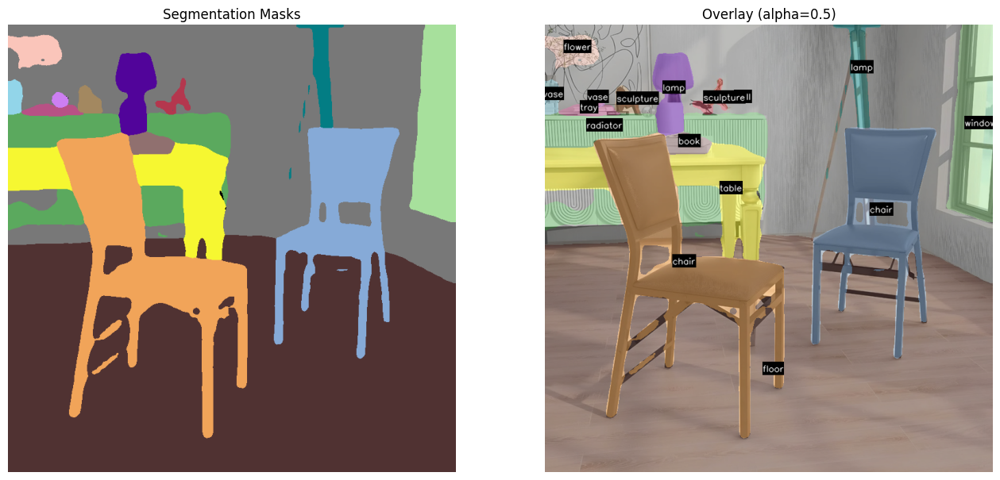

In [ ]:
image_path = "datasets/3d_test/chair.jpg"
image = Image.open(image_path).convert("RGB")

device = "cuda" if torch.cuda.is_available() else "cpu"

# load Mask2Former fine-tuned on ADE20k panoptic segmentation
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-large-ade-panoptic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-large-ade-panoptic", device_map=device)

inputs = processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

# model predicts class_queries_logits of shape `(batch_size, num_queries)`
# and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
class_queries_logits = outputs.class_queries_logits
masks_queries_logits = outputs.masks_queries_logits

result = processor.post_process_panoptic_segmentation(outputs, target_sizes=[image.size[::-1]], threshold=0.5)[0]
panoptic_seg_id = result["segmentation"].cpu().numpy()

# --- Create color mask ---
color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    # category_id = seg_info["category_id"] # This key does not exist
    label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
    cat = ade_BY_ID.get(label_id, None)
    if cat is None:
        continue

    mask = (panoptic_seg_id == segment_id)

    # Thing: random color per instance
    if cat["isthing"]:
        color = [random.randint(0, 255) for _ in range(3)]
    else:
        # Stuff: fixed COCO color
        color = cat["color"]

    color_mask[mask] = color

# --- Resize and overlay ---
original_np = np.array(image)
H, W = original_np.shape[:2]
color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

alpha = 0.5
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# --- Draw labels ---
for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    # category_id = seg_info["category_id"] # This key does not exist
    label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
    cat = ade_BY_ID.get(label_id, None)
    if cat is None:
        continue
    label_text = cat["name"]

    mask = (panoptic_id_resized == segment_id).astype(np.uint8)
    if mask.sum() == 0:
        continue

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
    largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    cx, cy = centroids[largest_idx]
    cx = int(np.clip(cx, 0, W - 1))
    cy = int(np.clip(cy, 0, H - 1))

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.5
    thickness = 1
    (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
    rect_tl = (cx-15, cy - text_height - baseline)
    rect_br = (cx-15 + text_width, cy + baseline)
    rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
    rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

    cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
    cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

# --- Display ---
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)
plt.show()

In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# load Mask2Former fine-tuned on COCO panoptic segmentation
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-base-coco-panoptic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-base-coco-panoptic", device_map=device)

With mask2former_coco,

`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.


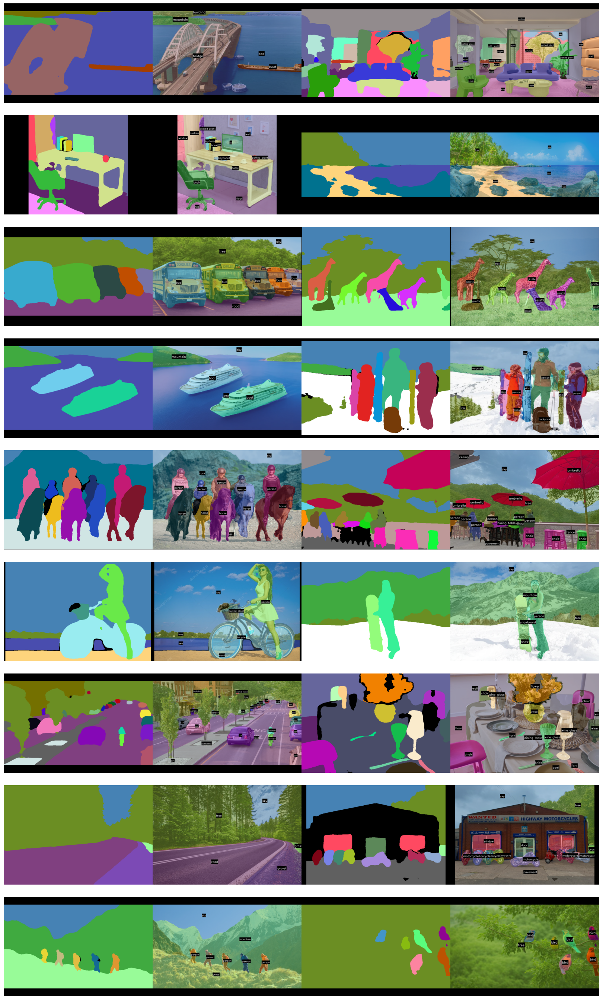

In [8]:
val_dir = "datasets/panoptic-tests"
num_samples = 18

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    # model predicts class_queries_logits of shape `(batch_size, num_queries)`
    # and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
    class_queries_logits = outputs.class_queries_logits
    masks_queries_logits = outputs.masks_queries_logits

    result = processor.post_process_panoptic_segmentation(outputs, target_sizes=[image.size[::-1]], threshold=0.5)[0]
    panoptic_seg_id = result["segmentation"].cpu().numpy()

    # --- Create color mask ---
    color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        # category_id = seg_info["category_id"] # This key does not exist
        label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
        cat = COCO_BY_ID.get(label_id, None)
        if cat is None:
            continue

        mask = (panoptic_seg_id == segment_id)

        # Thing: random color per instance
        if cat["isthing"]:
            color = [random.randint(0, 255) for _ in range(3)]
        else:
            # Stuff: fixed COCO color
            color = cat["color"]

        color_mask[mask] = color

    # --- Resize and overlay ---
    original_np = np.array(image)
    H, W = original_np.shape[:2]
    color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

    alpha = 0.5
    overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

    # --- Draw labels ---
    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        # category_id = seg_info["category_id"] # This key does not exist
        label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
        cat = COCO_BY_ID.get(label_id, None)
        if cat is None:
            continue
        label_text = cat["name"]

        mask = (panoptic_id_resized == segment_id).astype(np.uint8)
        if mask.sum() == 0:
            continue

        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
        largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        cx, cy = centroids[largest_idx]
        cx = int(np.clip(cx, 0, W - 1))
        cy = int(np.clip(cy, 0, H - 1))

        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        thickness = 1
        (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
        rect_tl = (cx-15, cy - text_height - baseline)
        rect_br = (cx-15 + text_width, cy + baseline)
        rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
        rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

        cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
        cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

    processed_imgs.append((color_mask, overlay_np))
    img_sizes.append(overlay_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()

In [11]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# load Mask2Former fine-tuned on ADE20k panoptic segmentation
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-large-ade-panoptic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-large-ade-panoptic", device_map=device)

With mask2former-_ade20k_large,

`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.
`label_ids_to_fuse` unset. No instance will be fused.


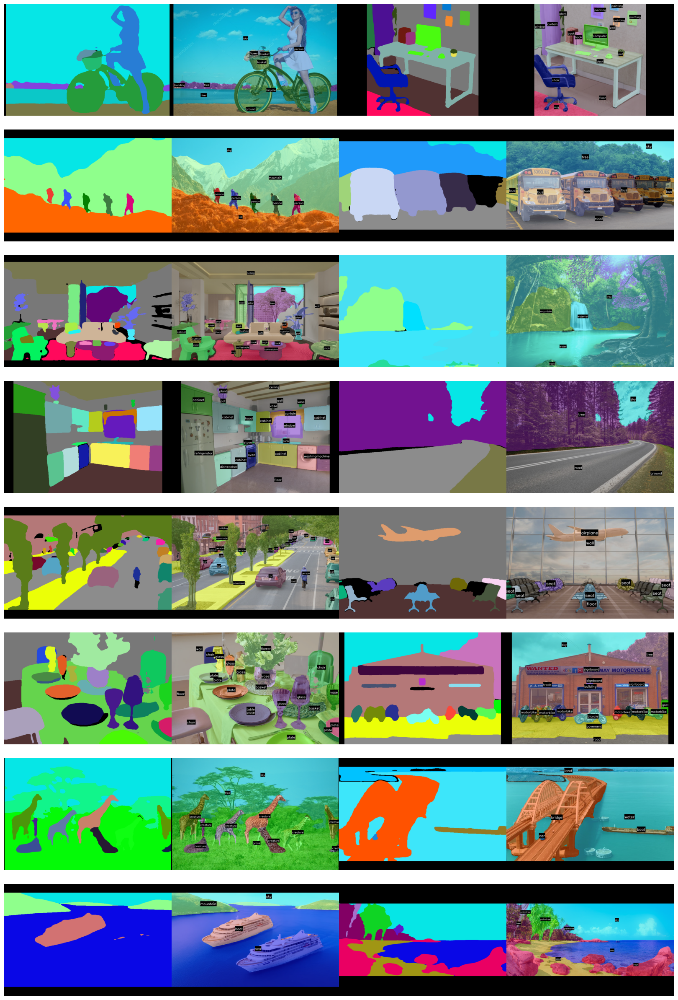

In [12]:
val_dir = "datasets/panoptic-tests-ade"
num_samples = 16

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    # model predicts class_queries_logits of shape `(batch_size, num_queries)`
    # and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
    class_queries_logits = outputs.class_queries_logits
    masks_queries_logits = outputs.masks_queries_logits

    result = processor.post_process_panoptic_segmentation(outputs, target_sizes=[image.size[::-1]], threshold=0.5)[0]
    panoptic_seg_id = result["segmentation"].cpu().numpy()

    # --- Create color mask ---
    color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        # category_id = seg_info["category_id"] # This key does not exist
        label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
        cat = ade_BY_ID.get(label_id, None)
        if cat is None:
            continue

        mask = (panoptic_seg_id == segment_id)

        # Thing: random color per instance
        if cat["isthing"]:
            color = [random.randint(0, 255) for _ in range(3)]
        else:
            # Stuff: fixed COCO color
            color = cat["color"]

        color_mask[mask] = color

    # --- Resize and overlay ---
    original_np = np.array(image)
    H, W = original_np.shape[:2]
    color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

    alpha = 0.5
    overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

    # --- Draw labels ---
    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        # category_id = seg_info["category_id"] # This key does not exist
        label_id = seg_info["label_id"] # Use 'label_id' instead of 'category_id'
        cat = ade_BY_ID.get(label_id, None)
        if cat is None:
            continue
        label_text = cat["name"]

        mask = (panoptic_id_resized == segment_id).astype(np.uint8)
        if mask.sum() == 0:
            continue

        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
        largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        cx, cy = centroids[largest_idx]
        cx = int(np.clip(cx, 0, W - 1))
        cy = int(np.clip(cy, 0, H - 1))

        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        thickness = 1
        (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
        rect_tl = (cx-15, cy - text_height - baseline)
        rect_br = (cx-15 + text_width, cy + baseline)
        rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
        rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

        cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
        cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

    processed_imgs.append((color_mask, overlay_np))
    img_sizes.append(overlay_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()